<div style="border:solid Chocolate 2px; padding: 40px">

<b>Анастасия, приветствую!</b>

Буду рада с тобой познакомиться. Меня зовут Евгения Маракова и я буду ревьюером твоего проекта. Если ты не против, то предлагаю общаться на "ты":) Если удобнее на "вы", то нет проблем, только скажи об этом.

В процессе работы ты встретишь комментарии <font color='green'>зеленого</font>, <font color='gold'>желтого</font> и <font color='red'>красного</font> цветов. Что они значат, смотри ниже:
    <br/>

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

<br/>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Решение на этом шаге станет еще лучше, если внести небольшие коррективы.
</div>


<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Решение на этом шаге требует существенной переработки и внесения правок. Напоминаю, что проект не может быть принят с первого раза, если ревью содержит комментарии, рекомендующие доработать шаги.
</div>
    
Увидев мой комментарий, не удаляй его, он будет очень полезен в случае повторной проверки работы😊
    
Свой комментарий помечай так, как показано ниже, тогда нам будет легче вести диалог, а мне выполнить повторную проверку проекта.
    <div class="alert alert-info"> <b>Комментарий студента: </b> </div>
    


# Рынок заведений общественного питания Москвы

В этом проекте мы подготовим исследование рынка Москвы для инвесторов из фонда «Shut Up and Take My Money».

Необходимо найти интересные особенности, включая расположение, меню и цены и презентовать полученные результаты, которые помогут инвесторам в выборе подходящего места для будущего кафе, бара или ресторана.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

**Цель исследования**

Сделать выводы о наиболее перспективных предприятиях питания Москвы с точки зрения типа, местоположения, масштаба и ценовой политики.

**План работы**

- изучение файла и предобработка данных
- исследовательский анализ данных: изучение категорий заведений, оценка количества сетевых и несетевых предприятий, анализ популярности ресторанов, 
- анализ по регионам: сколько заведений присутствуют в каждом районе Москвы, находим топ-15 улиц по количеству заведений и наоборот - улицы с единственным объектом, делаем выводы,
- рейтинг общепита по категориям, визуализация,
- анализ среднего чека, в том числе в центральном административном округе и других, делаем выводы
- отвечаем на вопросы для заказчика:

Сколько всего кофеен в датасете? 

В каких районах их больше всего, каковы особенности их расположения?

Есть ли круглосуточные кофейни?

Какие у кофеен рейтинги? 

Как они распределяются по районам?

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
- общий вывод

## Загрузка данных и изучение общей информации

Первым делом, загрузим все необходимые библиотеки для работы над проектом

In [1]:
#Let's import all necessary libraries
import pandas as pd
import datetime as dt
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import numpy as np
import folium
from folium import Map, Choropleth
import json
from folium import Map, Marker
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings("ignore")

Теперь откроем файл и посмотрим первые 5 строк информации

In [2]:
#Open file and read it
try:
    msc = pd.read_csv('/datasets/moscow_places.csv')
except:
    msc = pd.read_csv('moscow_places.csv')

#Show first 5 rows of data    
msc.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Пока все выглядит неплохо, данные прочитались, заголовки выглядят корректно.

Оценим общую информацию о датафрейме.

In [3]:
#Show main info about the data
msc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод по шагу 1**

В предоставленном файле 8406 строк и 14 столбцов информации о предприятиях общественного питания Москвы.

Это означает что перед нами 8.4 тыс заведений, но предстоит еще проверить их на дубликаты - возможно станет меньше.

Каждый столбец отвечает за ту или иную характеристику заведения:

name, category, address, district  — название, категория, адрес и район заведения, корректно в формате object;

hours — информация о днях и часах работы, пока в формате object т.к. тут смешанный тип информации, возможно для анализа придется делить эти данные и приводить к формату datetime часы, но это поймем позже;

lat, lng — широта и долгота географической точки, в которой находится заведение, корректно в формате float;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах, корректно в формате float;

price — категория цен в заведении, корретно в формате object т.к. это именно качественная характеристика: «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, а также фразу типа "Цена чашки капучино" либо "Средний счет", смешанный тип данных, поэтому корректно что тут формат object;

middle_avg_bill, middle_coffee_cup — число с оценкой среднего чека / чашки капучино, корректно в формате float;

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым, корректно в формате int;

seats — количество посадочных мест, скорее ожидалось в формате int но здесь в формате float, нужно будет поменять формат т.к. странно если где то 9 с половиной мест.


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Умница, ты отлично познакомилась с данными!
</div>

## Предобработка данных

Для начала проверим, есть ли в данных полные дубликаты

In [4]:
#Check full duplicates
msc.duplicated().sum()

0

Явные дубликаты отсутствуют, теперь оценим неявные.

Для этого приведем наименовие и адрес к нижнему регистру и поищем дубликаты в сочетании наименования и адреса.

In [5]:
#Make name and address str.lower
msc['name'] = msc['name'].str.lower()
msc['address'] = msc['address'].str.lower()
#Find duplicated restaurants
msc[msc[['name','address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


4 заведения задвоились: кафе на Ангарских прудах (можно было бы подумать что там несколько кафе, но тут совпадает долгота и широта и рейтинг, так что не остается сомневаться что это одна и та же точка); ресторан More poke; раковарня Клешни и хвосты и булочная Хлеб да выпечка. Удалим дубликаты.

In [6]:
#Drop duplicated restaurants
msc = msc.drop(index=[215,1511,2420,3109]).reset_index(drop=True)
#Check there is no more duplicates
msc[msc[['name','address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер, что поработала и с явными и неявными дублями!
</div>

Проверим что рейтинг принимает значения от 1 до 5.

In [7]:
#Check rating
print(msc['rating'].min())
print(msc['rating'].max())

1.0
5.0


Теперь посмотрим на пропуски в процентах от общего количества строк (8406 как мы помним из раздела 1).

In [8]:
#Show columns with omissions
msc.isna().sum()/8406*100

name                  0.000000
category              0.000000
address               0.000000
district              0.000000
hours                 6.364502
lat                   0.000000
lng                   0.000000
rating                0.000000
price                60.516298
avg_bill             54.556269
middle_avg_bill      62.491078
middle_coffee_cup    93.587913
chain                 0.000000
seats                42.945515
dtype: float64

Пропуски встречаются в колонках:

*hours* - часы работы - пока ничего не сможем с этим сделать, часы работы не присвоишь "по средней" или другим способом, это личное дело каждой компании - в какие часы работать. Благо пропусков всего 6%.

*price, avg_bill* - словами описанная качественная характеристика дороговизны заведения. В теории можно посмотреть по районам и если есть корреляция по этим значениям - заполнить аналогично. Пропусков очень много, 60.5% и 54.6% соответственно. 

*middle_avg_bill, middle_coffee_cup* - числовое усредненное значение характеристики дороговизны заведения. Также как и в предыдущем случае, имеет смысл посмотреть по районам или более детальной локации. Пропусков также много, 62.5% и 93.6% соответственно. 

*seats* - количество мест. Лучше не заполнять средней или медианой, это исказит данные. Пропусков много, 43%.

Проверим что районы заполнены корректно и посмотрим сколько заведений в каждом районе.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Пропуски не стоит удалять или заполнять, чтобы не исказить исследование!
</div>

In [9]:
#Let's see what districts we have
msc['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Районы заполнены хорошо.

Теперь посмотрим, сколько и какие в каждом районе категорий заведений исходя из размера цен.

In [10]:
#Group by district and show different price for each district
msc.groupby('district')['price'].value_counts()

district                                 price        
Восточный административный округ         средние          169
                                         выше среднего     30
                                         высокие           27
                                         низкие            18
Западный административный округ          средние          177
                                         выше среднего     68
                                         высокие           51
                                         низкие            11
Северный административный округ          средние          228
                                         высокие           50
                                         выше среднего     47
                                         низкие            18
Северо-Восточный административный округ  средние          229
                                         выше среднего     41
                                         низкие            21
               

Везде лидируют заведения с категорией цен "средние", но заполнить пропуски просто значением "средние" было бы слишком грубо

In [11]:
#Group by district and show different price for each district
msc.groupby('district')['avg_bill'].value_counts()

district                          avg_bill                    
Восточный административный округ  Средний счёт:1000–1500 ₽        20
                                  Средний счёт:300–500 ₽          13
                                  Средний счёт:1500–2000 ₽         9
                                  Средний счёт:500–1000 ₽          9
                                  Средний счёт:700–1000 ₽          9
                                                                  ..
Южный административный округ      Цена чашки капучино:от 100 ₽     1
                                  Цена чашки капучино:от 129 ₽     1
                                  Цена чашки капучино:от 130 ₽     1
                                  Цена чашки капучино:от 170 ₽     1
                                  Цена чашки капучино:от 200 ₽     1
Name: avg_bill, Length: 1836, dtype: int64

Разброс данных по среднему счету и цене чашки капучино нам тоже вряд ли поможет сейчас.

In [12]:
#Group by district and show different price for each district
msc.groupby('district')['middle_avg_bill'].value_counts()

district                          middle_avg_bill
Восточный административный округ  1250.0             20
                                  300.0              18
                                  400.0              17
                                  750.0              11
                                  1000.0             11
                                                     ..
Южный административный округ      1400.0              1
                                  1700.0              1
                                  2500.0              1
                                  3000.0              1
                                  35000.0             1
Name: middle_avg_bill, Length: 708, dtype: int64

А вот это уже интересно: если присутствуют данные о среднем значении среднего счета и отсутствуют данные по качественной характеристике, можно заполнить арактеристику исходя из среднего значения, т.к. они по смыслу связаны.

Проблема в том, что в колонке middle_avg_bill пропусков еще больше, чем в колонке price.

Пока оставим все как есть.

Создадим столбец street с названиями улиц из столбца с адресом.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично, оставляем все как есть:)
</div>

In [13]:
#Create street column with street name from address
msc['street'] = msc.address.apply(lambda x: x.split(', ')[1])
msc.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Столбец добавлен корректно!
</div>

Теперь создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

Посмотрим какие бывают часы работы в нашем датафрейме:

In [14]:
msc['hours'].value_counts()

ежедневно, 10:00–22:00                                                  758
ежедневно, круглосуточно                                                730
ежедневно, 11:00–23:00                                                  396
ежедневно, 10:00–23:00                                                  310
ежедневно, 12:00–00:00                                                  254
                                                                       ... 
пн 08:00–19:30; вт-пт 08:00–21:00; сб,вс 09:30–21:00                      1
ежедневно, 18:00–05:00                                                    1
пн-ср 10:30–22:30; чт 11:00–00:00; пт,сб 10:30–01:00; вс 10:30–22:30      1
пн-чт 20:00–06:00; пт,сб 19:00–06:00; вс 20:00–06:00                      1
пн-пт 12:00–00:00                                                         1
Name: hours, Length: 1306, dtype: int64

Нам нужно выделить заведения, у которых в hours числится "ежедневно, круглосуточно"; по анализу выше их 730.

In [15]:
#Create column with 24/7 restaurants
msc['is_24/7'] = np.where(msc['hours'].str.contains('круглосуточно') & msc['hours'].str.contains('ежедневно'), True, False)
msc['is_24/7'].value_counts()

False    7672
True      730
Name: is_24/7, dtype: int64

Одно заведение куда-то потерялось, всего 725, но это не критично.

Для удобства дальнейшей работы, заменим также в столбце chain значения: 0 на "несетевые" и 1 на "сетевые"

In [16]:
#Change values in chains
msc['chain'] = msc['chain'].replace(0,'несетевые')
msc['chain'] = msc['chain'].replace(1,'сетевые')
msc['chain'].value_counts()

несетевые    5199
сетевые      3203
Name: chain, dtype: int64

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отличная идея!
</div>

In [17]:
msc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8402 entries, 0 to 8401
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   object 
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24/7            8402 non-null   bool   
dtypes: bool(1), float64(6), 

Посмотрим какая получилась итоговая таблица для работы с данными.

In [18]:
#Show first 5 rows of dataframe
msc.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевые,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевые,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевые,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевые,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевые,148.0,правобережная улица,False


<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Стоит вывести таблицу с новыми столбцами, чтобу убедиться в корректности проделанной работы и продемонстрировать свои труды:)
</div>

<div class="alert alert-info"> <b>
    Добавила!
       
</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Умничка!
</div>

Напоследок, оценим есть ли выбросы в данных. Для этого нужно проверить колонки с числовыми данными:

middle_avg_bill

middle_coffee_cup

seats

In [19]:
#Show 99 percentile for numeric data
print('Средний чек аномально большой свыше', np.nanpercentile(msc["middle_avg_bill"], 99))
print('Средняя стоимость капучино аномально большая свыше', np.nanpercentile(msc["middle_coffee_cup"], 99))
print('Кол-во мест аномально большое свыше', np.nanpercentile(msc["seats"], 99))

Средний чек аномально большой свыше 3750.0
Средняя стоимость капучино аномально большая свыше 309.8999999999995
Кол-во мест аномально большое свыше 625.0


In [20]:
#We need to fill NAN with '0' before dropping great values
msc = msc.fillna(0)
#Check df size
msc.shape

(8402, 16)

In [21]:
#Drop middle average bill over 99 percentile
msc = msc.loc[msc['middle_avg_bill']<3750]
#Check df size
msc.shape

(8365, 16)

In [22]:
#Drop middle average coffee cup over 99 percentile
msc = msc.loc[msc['middle_coffee_cup']<310]
#Check df size
msc.shape

(8359, 16)

In [23]:
#Drop seats cup over 99 percentile
msc = msc.loc[msc['seats']<625]
#Check df size
msc.shape

(8307, 16)

In [24]:
print('Удалено',(8406-8307)/8406*100,'процентов данных')

Удалено 1.177730192719486 процентов данных


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Настя, молодец! Хорошо поработала с аномалиями!
</div>

**Вывод по шагу 2**

- явные дубликаты в данных отсутствуют, из неявных найдено 4 - удалены;
- пропусков много: в колонке hours 6%, в колонке price 60.5%, в колонке avg_bill 54.6%, middle_avg_bill - 62.5%, middle_coffee_cup - 93.6%, и в колонке seats - 43%. Лучше не заполнять средней или медианой, это исказит данные;
- для дальнейшей работы, добавлен столбец street с названиями улиц из столбца с адресом;
- также добавлен столбец 'is_24/7' для определения круглосуточных заведений
- проведен анализ аномально больших значений (более 99 персентиля) для среднего чека, ср.чашки кофе и кол-ва мест. Удалены выбросы свыше 99 персентиля, это составило 1.18% данных

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

## Анализ данных

Какие категории заведений представлены в данных? 

Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары.

In [25]:
#Prepare data for pie plot: group categories and sort values descending order
cat = msc.groupby('category')['name'].count().reset_index().sort_values(by='name',ascending=False).\
                                                                set_index('category').reset_index()

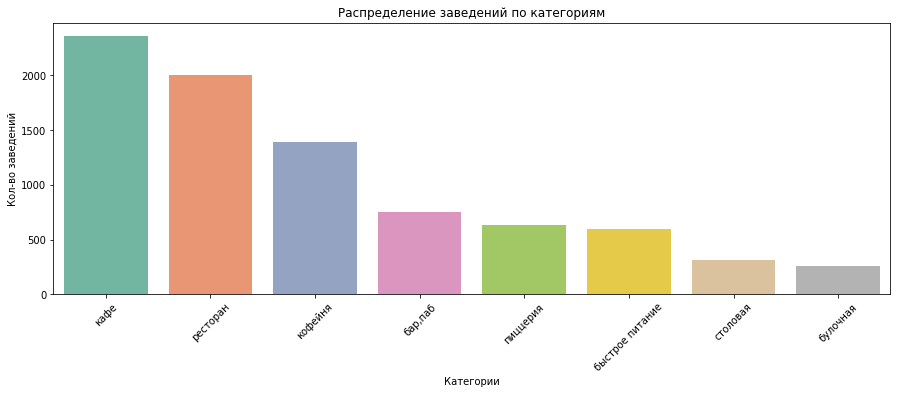

In [26]:
#Build barplot for categories 
plt.figure(figsize=(15,5))
sns.barplot(data=cat, x='category', y='name', palette = 'Set2')
plt.xticks(rotation=45)
plt.xlabel('Категории')
plt.ylabel('Кол-во заведений')
plt.title('Распределение заведений по категориям')
plt.show()

Очевидно лидируют заведения типа "кафе", их более 2500 шт, на пятки наступают "рестораны", которых чуть более 2000, бронза достается "кофейням" - таких около 1400, судя по графику.

Бары/пабы, пиццерии и фаст-фуд примерно на одном уровне, 600-700 шт, значительно отстают от кафе и ресторанов.

Булочных и столовых совсем мало, по 200-300 шт.

Посмотрим также распределение на круговой диаграмме.

In [27]:
cat

,category,name
0,кафе,2362
1,ресторан,2004
2,кофейня,1395
3,"бар,паб",748
4,пиццерия,629
5,быстрое питание,601
6,столовая,313
7,булочная,255


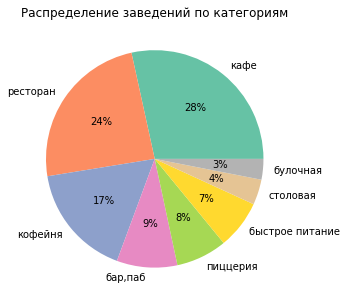

In [28]:
#Show distribution of categories on pie plot
plt.figure(figsize=(15,5))
colors = sns.color_palette('Set2')
plt.pie(cat['name'], labels = cat['category'], colors = colors, autopct='%.0f%%')
plt.title('Распределение заведений по категориям')
plt.show()

Рестораны и кафе покрывают более половины всех категорий заведений, кофейни занимают еще 17%, бары 9%.

Остальные категории все вместе составляют примерно четверть общей совокупности.


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Красота! Супер, что рассмотрела и количественный показатель и долю:)
</div>

Теперь исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 

Тут для наглядности идеально подойдет столбчатая диаграмма, но сперва посчитаем сколько в среднем мест в каждом типе заведения (по медиане).

In [29]:
#Prepare data for plot: group category by seats and sort values
seats = msc.query('seats != 0')
seats = seats.groupby('category')['seats'].median().reset_index().sort_values(by='seats',ascending=False)

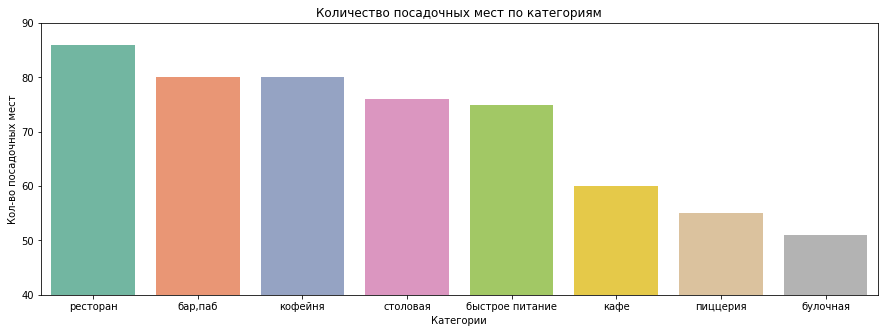

In [30]:
#Show number of seats by categories
plt.figure(figsize=(15,5))
sns.barplot(x='category',y='seats',data=seats,palette = 'Set2')
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Кол-во посадочных мест')
plt.ylim(40,90)
plt.show()

Интересный результат! Мы взяли для сравнения медианное кол-во мест в заведениях, и на первом месте довольно ожидаемо - рестораны, где среднее кол-во около 85 мест. 

А вот на втором - бары/пабы, где около 80 мест. Видимо потому что там всегда есть барная стойка и за ней можно посадить много людей. Тут же кофейни - там также часто есть стойки за которыми можно пить кофе, хотя результат все равно немного неожиданный

В остальном результат ожидаемый - около 50-60 посадочных мест в среднем.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Согласна, удивляет:) Задание выполнено верно!
</div>

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

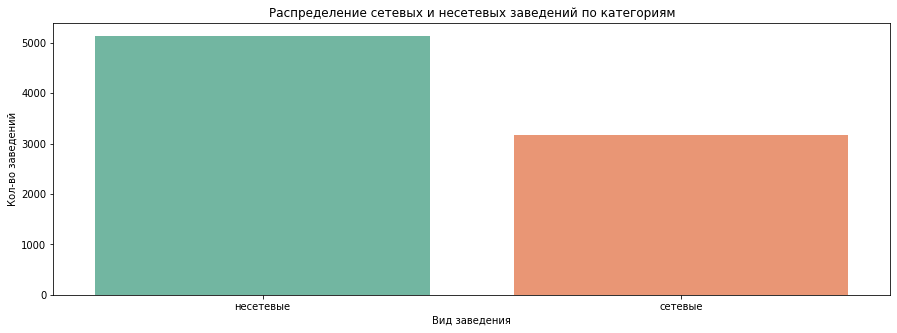

In [31]:
#Build plot for distribution of chain and non-chain restaurants
plt.figure(figsize=(15,5))
sns.countplot(x=msc["chain"],palette = 'Set2')
plt.title('Распределение сетевых и несетевых заведений по категориям')
plt.xlabel('Вид заведения')
plt.ylabel('Кол-во заведений')
plt.show()

Несетевых заведений больше - их более 5000, тогда как сетевых - чуть более 3000.

Теперь посмотрим на распределение по категориям.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо!
</div>

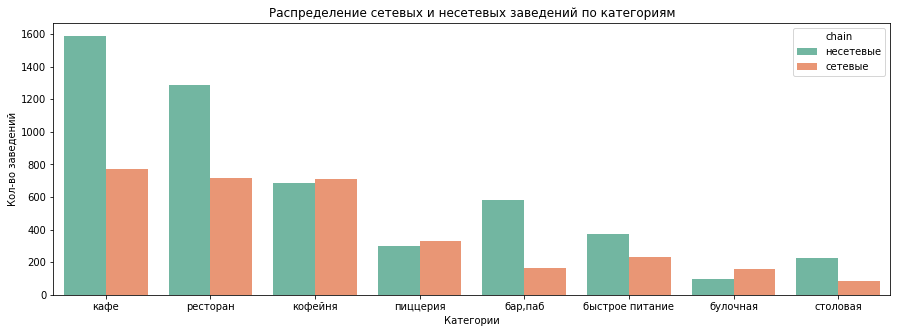

In [32]:
#Build plot for distribution of chain and non-chain restaurants
plt.figure(figsize=(15,5))
sns.countplot(x=msc["category"], hue=msc["chain"],palette = 'Set2')
plt.title('Распределение сетевых и несетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Кол-во заведений')
plt.show()

У кафе и ресторанов, баров, фаст-фуда и столовых лидируют заведения-одиночки.

А вот кофейни, пиццерии и булочные показывают другой результат - тут сетевые заведения побеждают!

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, совершенно верно!
</div>

Далее сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве по количеству заведений этой сети в регионе. 

In [33]:
#Group chain restaurants by name
chain = msc.query('chain=="сетевые"')
pop_chain = chain.groupby('name').agg({'category':'count'}).reset_index().sort_values(by='category',ascending=False).head(15)

Отобразим самые популярные заведения на графике.

In [34]:
#Build plot for top-15 retsaurants
fig = px.bar(pop_chain, x='name', y='category', text="category")
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.update_layout(title_text='Самые популярные заведения Москвы')
fig.show()

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Круговую диаграмму рекомендую использовать, если количество категорий не превышает 4 - 5, в данном случае она выглядит малоинформативной. Будет здорово, если добавишь столбчатый график с количественными показателями:)
</div>

<div class="alert alert-info"> <b>
    Добавила!
       
</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Плюсик
</div>

Все сети на слуху - кто не знает Шоколадницу, или Доминос пиццу. Я лично регулярно беру капичино в One price или в Cofix.

Примечательно, что самые популярные сетевые заведения относятся к категориям "кафе" и "пиццерия". 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Прекрасно!
</div>

Ранее в шаге 2 мы уже посмотрели какие административные районы Москвы присутствуют в датасете - это 9 административных округов столицы. 

Сколько же заведений по районам? Попробуем показать на одном графике и общее количество заведений по районам, и категории.

In [35]:
#Create pivot table with all categories by district
rest_district_categ = msc.pivot_table(index=['district'],
                                     columns=['category'],
                                     values='name',
                                     aggfunc='count')
rest_district_categ

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,50,25,69,270,103,72,159,40
Западный административный округ,46,37,62,233,146,70,209,23
Северный административный округ,65,38,58,230,184,74,181,40
Северо-Восточный административный округ,62,28,82,268,159,68,181,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,358,50,87,464,426,113,653,66
Юго-Восточный административный округ,38,13,67,281,88,55,145,25
Юго-Западный административный округ,38,27,61,237,96,64,167,17
Южный административный округ,68,25,85,264,131,73,200,44


In [36]:
sorted_district_categ = rest_district_categ.sum(axis=1).sort_values().index

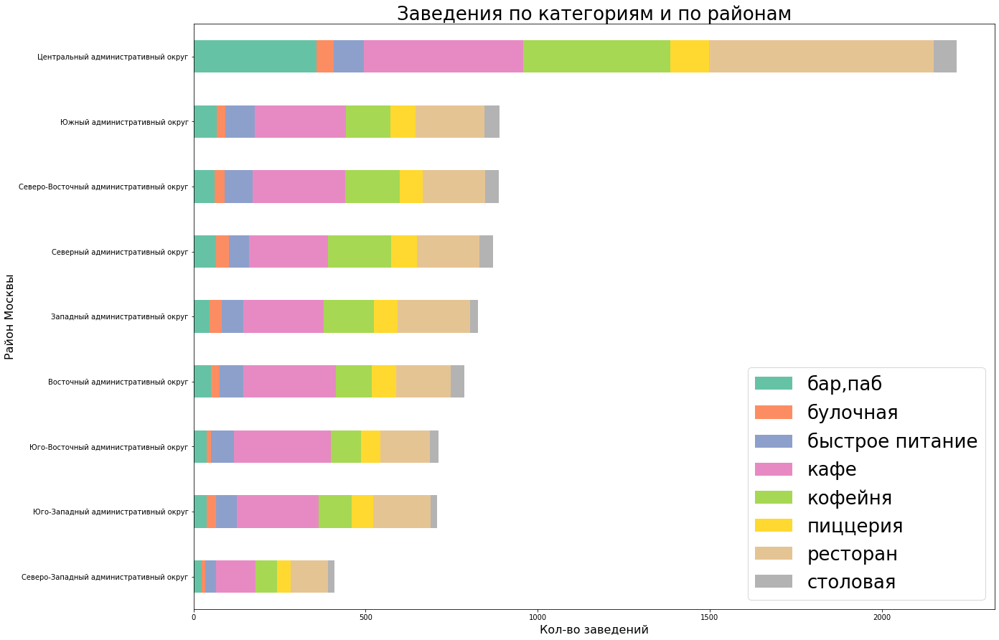

In [37]:
#Build plot with number of restaurants by categoroes and by district
rest_district_categ.loc[sorted_district_categ].plot(kind='barh',stacked=True, figsize=(20,15),colormap='Set2')
plt.title('Заведения по категориям и по районам', fontdict={'size':26})
plt.ylabel('Район Москвы', fontsize=16)
plt.xlabel('Кол-во заведений', fontsize=16)
plt.legend(prop={'size': 26})
plt.show()

Во всех районах предобладают кафе и рестораны, но в ЦАО самый большой процент баров (мятный цвет), а ЮАО - лидер по фаст-фудам (голубой цвет).

Посмотрим теперь, как распределены рейтинги по категориям заведений. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер, отличный график с накоплением получился!
</div>

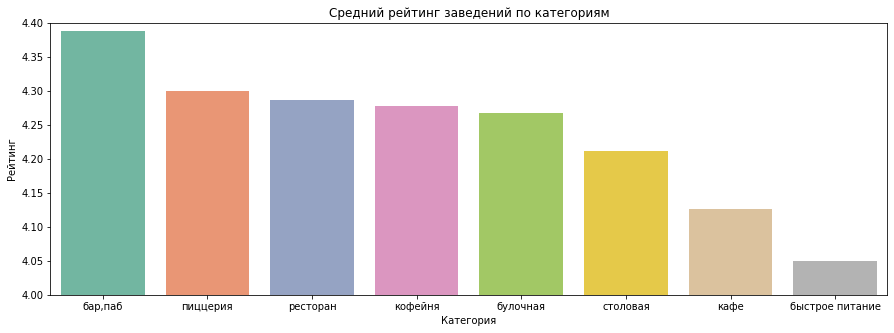

In [38]:
#Show average rating by categories
rating = msc.groupby('category').agg({'rating':'mean'}).reset_index().sort_values(by='rating', ascending=False)
plt.figure(figsize=(15,5))
sns.barplot(x='category',y='rating',data=rating,palette = 'Set2')
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.ylim(4,4.4)
plt.show()

Средний рейтинг варьирует от 4.05 до 4.40, на графике выше хорошо видно что выше всего средний рейтинг у баров (почти 4.40), самый низкий средний рейтинг - у фаст фуда (примерно 4.05). Видимо, оценки барам ставят навеселе, а фаст фуд оставляет тяжелые воспоминания... в желудке.

Довольно высокие средние рейтинги у пиццерий, ресторанов, кофеен и булочных - между 4.25 и 4.30.

Чуть ниже рейтинг столовых - ближе к 4.20, и кафе - примерно 4.13.

Можно также рассмотреть распределение рейтинга по каждой категории.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Все верно! 
</div>

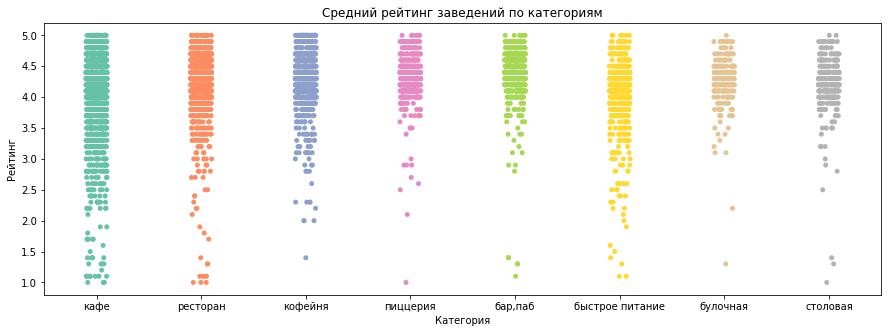

In [39]:
#Show distribution of rating by categories
plt.figure(figsize=(15,5))
sns.stripplot(x='category',y='rating',data=msc,palette = 'Set2')
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.show()

Самое разряженное распределение - у кафе: видимо, тут оценки ставят много и охотно, и разные, поэтому есть и единицы, и двойки, но также много 4 и 5.

Похожие распределения у ресторанов и фаст фуда - много оценок выше 3, но есть злопыхатели которые ставят меньше 3.

Кофейни получают много 4 и 5, но также и троек немало.

Остальные категории довольно стабильно получают 4 и 5.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, что рассмотрела вопрос дополнительно!
</div>

Построим фоновую хороплет со средним рейтингом заведений каждого района.

Подготовим данные - найдем средний рейтинг по районам.

In [40]:
#Show average rating by district
rating = msc.groupby('district').agg({'rating':'mean'}).reset_index()

In [41]:
# import JSON-file with Moscow district edges
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - latitide of Moscow center, moscow_lng - longitude of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423
# create Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# build choroplet using Choropleth and add it to map
Choropleth(
    geo_data=state_geo,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# show map
m

Самый синий цвет - в ЦАО, значит там наивысший средний рейтинг.

Но также радует относительно высокими рейтингами и САО, СЗАО, где цвет бирюзовый.

А вот на юго-востоке рейтинги ниже всего. Цвет ближе к желтому.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

Отобразим все заведения датасета на карте с помощью кластеров.

In [42]:
# moscow_lat - latitide of Moscow center, moscow_lng - longitude of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423
# create Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#create empty claster and add it to map
marker_cluster = MarkerCluster().add_to(m)
# build function to take df row and create marker in current point and add it to claster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# use function create_clusters() to every df row
msc.apply(create_clusters, axis=1)

# выводим карту
m

Судя по цифрам на кластерах, опять же видно что больше всего заведений в ЦАО.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Центр лидирует по все показателям:)
</div>

Найдем топ-15 улиц по количеству заведений с учетом категорий.

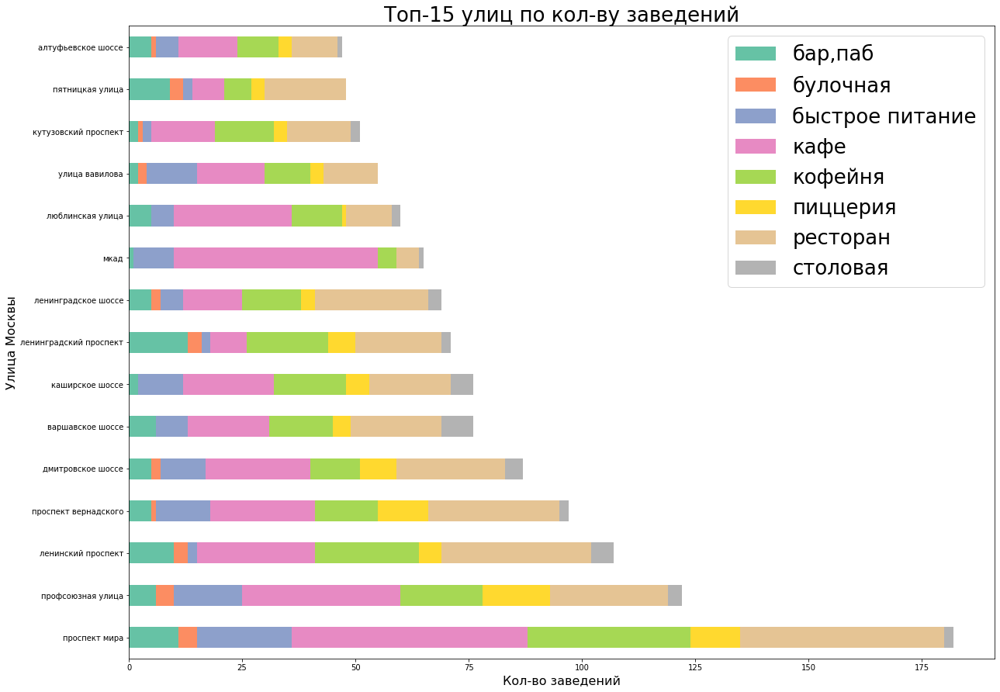

In [43]:
#Create pivot table with all categories by street
top_streets = msc.pivot_table(index=['street'],
                                     columns=['category'],
                                     values='name',
                                     aggfunc='count')
sorted_street_categ = top_streets.sum(axis=1).sort_values(ascending=False).head(15).index
#Build plot with number of restaurants by categoroes and by district
top_streets.loc[sorted_street_categ].plot(kind='barh',stacked=True, figsize=(20,15),colormap='Set2')
plt.title('Топ-15 улиц по кол-ву заведений', fontdict={'size':26})
plt.ylabel('Улица Москвы', fontsize=16)
plt.xlabel('Кол-во заведений', fontsize=16)
plt.legend(prop={'size': 26})
plt.show()

Самая "едальная" улица Москвы - Проспект мира, видимо потому что длина его составляет почти 9 км. На ней очень много кафе, ресторанов и кофеен.

При этом Пятницкая ул всего 1815 метров, но находится в центре города и поэтому плотность заведений на ней зашкаливает. При этом преобладают на ней рестораны и бары.

Найдем улицы, на которых находится только один объект общепита. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

In [44]:
#Create table with sreets with only 1 restaurant
low_streets = msc.groupby('street').agg({'name':'count'}).reset_index()
low_streets = low_streets.query('name == 1')
low_streets['street'].unique()

array(['1-й автозаводский проезд', '1-й балтийский переулок',
       '1-й варшавский проезд', '1-й вешняковский проезд',
       '1-й голутвинский переулок', '1-й грайвороновский проезд',
       '1-й дербеневский переулок', '1-й земельный переулок',
       '1-й капотнинский проезд', '1-й кирпичный переулок',
       '1-й колобовский переулок', '1-й котляковский переулок',
       '1-й курьяновский проезд', '1-й новокузнецкий переулок',
       '1-й рижский переулок', '1-й самотёчный переулок',
       '1-й сетуньский проезд', '1-й спасоналивковский переулок',
       '1-й щипковский переулок', '1-я боевская улица',
       '1-я курьяновская улица',
       '1-я линия хорошёвского серебряного бора', '1-я парковая улица',
       '1-я стекольная улица', '1-я фрунзенская улица',
       '1-я ямская улица', '11-я парковая улица', '12-я парковая улица',
       '14-я парковая улица', '16-я парковая улица',
       '17-й проезд марьиной рощи', '2-й балтийский переулок',
       '2-й боткинский проезд', '

Судя по названию улиц, это промышенные районы, в которых обычно мало людей гуляет и предприятия питания там представлены столовыми для рабочих или заводскими кафе.

Также присутствует много коротких улиц - с названием "тупик", "проезд", "переулок". В связи со своим коротким размером на них не требуется много ресторанов.

Посмотрим к каким категориям относятся заведения на этих улицах.

In [45]:
#Show what are the categories of restaurants on low streets
list_lowstreets = low_streets['street'].tolist()
low_streets_cat = msc.query('street in @list_lowstreets')
low_streets_cat_grouped = low_streets_cat.groupby('category').agg({'name':'count'}).reset_index().\
                            sort_values(by='name',ascending=False)

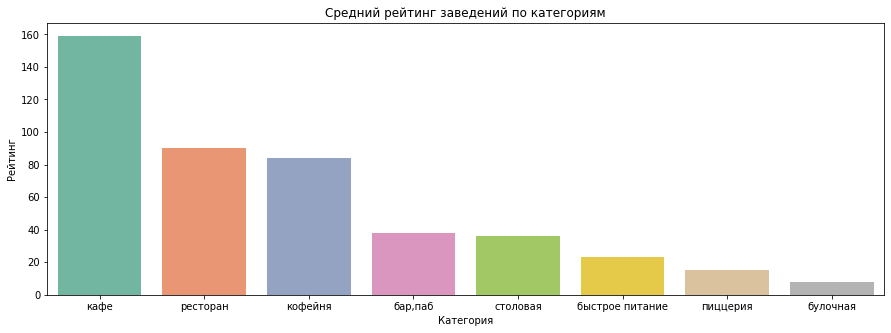

In [46]:
#Build plot for low streets categories
plt.figure(figsize=(15,5))
sns.barplot(x='category',y='name',data=low_streets_cat_grouped,palette = 'Set2')
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.show()

В основном на таких улицах кафе, но бывают также рестораны и кофейни.

Еще оценим в каких районах они преобладают и какой у них средний рейтинг.

In [47]:
#Aanalyse low streets by district
low_streets_cat_dist = low_streets_cat.groupby('district').agg({'name':'count','rating':'median'}).reset_index().\
                            sort_values(by='name',ascending=True)

In [48]:
#Build plot for low streets by district
fig = px.bar(low_streets_cat_dist, x='name', y='district', text="rating")
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.show()

Большинство улиц с одним заведением находится в ЦАО, при этом и рейтинг заведений самый высокий. Скорее всего, это кафе на маленьких улицах - переулках и проездах.

А вот кафе в других округах с рейтингом пониже - это вполне возможно столовыет и фаст-фуд в промышленных районах.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Согласна!
</div>

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 По данным улицам необходимо провести какое-нибудь исследование. Можешь рассмотреть рейтинги, категории или расположение по округам:)
</div>

<div class="alert alert-info"> <b>
    Я выводила их на карту, но не увидела ничего особенного, поэтому не стала добавлять это в проект.
    Добавила анализ по районам и рейтингу, а также по категориям.
       
</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, этого достаточно:)
</div>

Посмотрим на средний чек по районам Москвы.

In [49]:
#Show average rating by district
avg_bill = msc.query('middle_avg_bill != 0')
avg_bill_grouped = avg_bill.groupby('district').agg({'middle_avg_bill':'median'}).reset_index().\
sort_values(by='middle_avg_bill',ascending=False)
avg_bill_grouped['middle_avg_bill'] = round(avg_bill_grouped['middle_avg_bill'],1)
avg_bill_grouped

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,925.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Самый низкий медианный чек -450 руб - в ЮВАО, самый высокий - 100 руб - в ЦАО. 

Посмотрим как это выглядит на карте.

In [50]:
# import JSON-file with Moscow district edges
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - latitide of Moscow center, moscow_lng - longitude of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423
# create Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# build choroplet using Choropleth and add it to map
Choropleth(
    geo_data=state_geo,
    data=avg_bill_grouped,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний счет заведений по районам',
).add_to(m)

# show map
m

Самый высокий средний чек - в ЦАО и ЗАО, где расположены такие транспортные артерии как Кутузовский проспект и Рублевская улица, переходящая в Рублевское шоссе.

На втором месте - САО и СЗАО, а остальные районы пониже и примерно на одном уровне. 

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Настя, давай-ка сгладим выбросы и рассмотрим вопрос по медиане:)
</div>

<div class="alert alert-info"> <b>
    Исправила, картина поменялась)
       
</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

Оценим зависимость рейтинга от среднего чека с учетом того, сетевое заведение или нет.

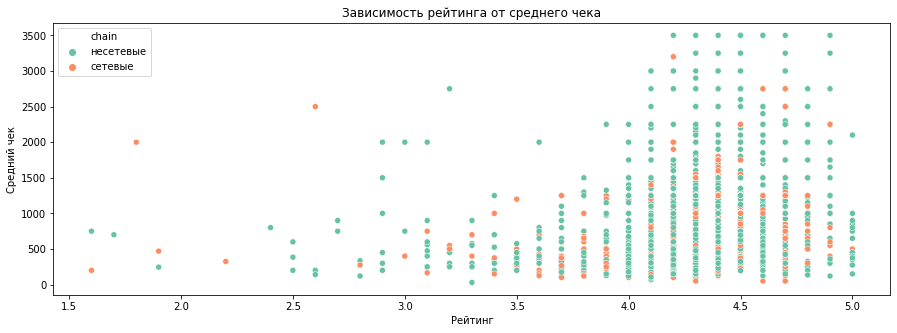

In [51]:
#Build scatterplot for rating and average cheque
plt.figure(figsize=(15,5))
sns.scatterplot(x='rating',y='middle_avg_bill',data=avg_bill,palette = 'Set2',hue='chain')
plt.title('Зависимость рейтинга от среднего чека')
plt.xlabel('Рейтинг')
plt.ylabel('Средний чек')
plt.show()

В целом очевидно, что высокие рейтинги у заведений с максимальными чеками, но также много высоких оценок и у бюджетных заведений. При этом, есть точечные плохие оценки у ресторанов с ценником выше среднего, а максимальная концентрация пятерок - для чеков до 1000 руб.

То является ли заведение сетевым или нет тут сильно не влияет.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер!
</div>

Зависит ли рейтинг от того, является ли заведение круглосуточным? Посмотрим на графике и опять же добавим детализацию по признаку сетевого заведения.

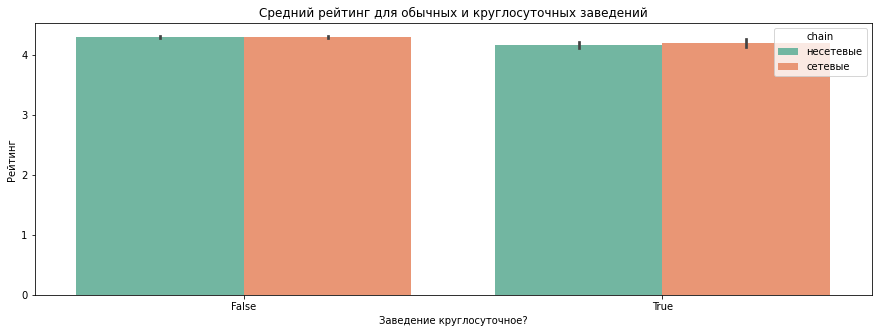

In [52]:
#Build plt for round-the-clock restaurants with rating
plt.figure(figsize=(15,5))
sns.barplot(data=avg_bill, x='is_24/7', y='rating', palette = 'Set2',hue='chain')
plt.title('Средний рейтинг для обычных и круглосуточных заведений')
plt.xlabel('Заведение круглосуточное?')
plt.ylabel('Рейтинг')
plt.show()

Рейтинг круглосуточных заведений чуть ниже, хотя совсем незначительно. 

Также нет большой разницы от того, является ли заведение сетевым или нет.

В заключение, посмотрим влияет ли на рейтинг кол-во посадочных мест.

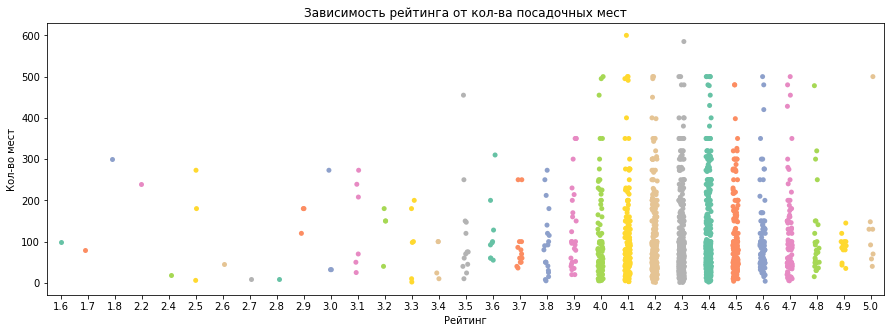

In [53]:
#Exclude restaurants with 0 seats
avg_bill_seats = avg_bill.query('seats != 0')
#Build scatterplot for rating and seats number
plt.figure(figsize=(15,5))
sns.stripplot(x='rating',y='seats',data=avg_bill_seats,palette = 'Set2')
plt.title('Зависимость рейтинга от кол-ва посадочных мест')
plt.xlabel('Рейтинг')
plt.ylabel('Кол-во мест')
plt.show()

Распределение довольно похожее на все предыдущие - много оценок 4-5 по заведениям с разным количеством мест.

Можно отметить что всего одна 5 у заведения с большим кол-вом мест - 500, то есть хороший балл никто не ставит если мест более 150. Это стоит учесть при планировании своего ресторана - слишком большие не нравятся посетителям.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Умница, что рассматриваешь дополнительные вопросы!
</div>

**Вывод по шагу 3**

- Исследовано количество заведений по категориям: оно варьирует от 250 до 2500, лидируют заведения типа "кафе" (28% от общего кол-ва), а меньше всего булочных (3%);
- По количеству посадочных мест: на первом месте рестораны, где медианное кол-во около 85 мест; на втором - бары/пабы и кофейни, где около 80 мест. Меньше всего мест в булочных - по медиане 50.
- Сетевые / несетевые заведения: несетевых заведений больше - их более 5000, тогда как сетевых - чуть более 3000. У кафе и ресторанов, баров, фаст-фуда и столовых лидируют заведения-одиночки. А вот кофейни, пиццерии и булочные чаще встречаются сетевые.
- топ-15 популярных сетей в Москве по количеству заведений этой сети в регионе: 'шоколадница', "домино'с пицца", 'додо пицца', 'one price coffee', 'яндекс лавка', 'cofix', 'prime', 'хинкальная', 'кофепорт', 'теремок', 'кулинарная лавка братьев караваевых', 'чайхана', 'буханка', 'cofefest', 'му-му'
- по районам и по категориям: больше всего заведений в ЦАО; во всех районах предобладают кафе и рестораны, но в ЦАО самый большой процент баров, а ЮАО - лидер по фаст-фудам;
- рейтинг заведений по категориям: средний рейтинг варьирует от 4.05 до 4.40, выше всего средний рейтинг у баров (почти 4.40), самый низкий средний рейтинг - у фаст фуда (примерно 4.05);
- рейтинг по районам: в ЦАО наивысший средний рейтинг, но также радует относительно высокими рейтингами и САО, СЗАО, а вот на юго-востоке рейтинги ниже всего;
- улицы с наибольшим кол-вом заведений: 'проспект мира', 'профсоюзная улица', 'ленинский проспект', 'проспект вернадского', 'дмитровское шоссе', 'варшавское шоссе', 'каширское шоссе', 'ленинградский проспект', 'ленинградское шоссе', 'мкад', 'люблинская улица', 'улица вавилова', 'кутузовский проспект', 'пятницкая улица', 'алтуфьевское шоссе'
- самая "едальная" улица Москвы - Проспект мира, на нем очень много кафе, ресторанов и кофеен; а вот на Пятницкой ул преобладают рестораны и бары.
- в Москве 453 улицы с единственным заведением общественного питания. Судя по названиям, это улицы в промзонах, а также короткие улицы - переулки, тупики; в основном это заведения категории кафе, большая часть находится в ЦАО с рейтингом 4.4, остальные разбросаны по другим районам Москвы с рейтингом 4.1-4.3;
- средний чек варьирует от 450 до 1000 рублей; самый высокий средний чек - в ЦАО и ЗАО, ниже всех средний чек в ЮВАО,ЮАО и САО.

Дополнительные исследования:
- зависимость рейтинга от среднего чека с учетом того, является ли заведение сетевым
Высокие рейтинги у заведений с максимальными чеками, но также много высоких оценок и у бюджетных заведений. При этом, есть точечные плохие оценки у ресторанов с ценником выше среднего.
То является ли заведение сетевым или нет тут сильно не влияет.
- зависимость рейтинга от того, является ли заведение круглосуточным
Рейтинг круглосуточных заведений чуть ниже, хотя совсем незначительно. Также нет большой разницы от того, является ли заведение сетевым или нет.
- зависимость рейтинга от количества посадочных мест
Заметили что высшую оценку поставили всего 1 раз заведению более 150 мест, то есть слишком большие заведения не нравятся посетителям.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер, что собрала все данные и оформила общий вывод!
</div>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Откорректируй только средний чек:)
</div>

<div class="alert alert-info"> <b>
    Готово)
       
</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Принято!
</div>

## Открытие кофейни

Посчитаем, сколько всего кофеен в Москве

In [54]:
#Count coffee houses 
coffeehouses = msc.query('category == "кофейня"')
print('В Москве насчитывается',coffeehouses['category'].count(),'кофеен')

В Москве насчитывается 1395 кофеен


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Верно!
</div>

Также посмотрим, в каких районах их больше всего и каковы особенности их расположения на карте.

In [55]:
# moscow_lat - latitide of Moscow center, moscow_lng - longitude of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423
# create Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#create empty claster and add it to map
marker_cluster = MarkerCluster().add_to(m)
# build function to take df row and create marker in current point and add it to claster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# use function create_clusters() to every df row
coffeehouses.apply(create_clusters, axis=1)

# выводим карту
m

Больше всего кофеен в ЦАО, ЗАО и САО/СВАО, там же где самые высокие рейтинги и средние чеки заведений.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо!
    
</div>

Посмотрим, есть ли круглосуточные кофейни.

In [56]:
#Count coffee houses that work round-the-clock
coffeehouses.groupby('is_24/7')['name'].count()

is_24/7
False    1336
True       59
Name: name, dtype: int64

Всего 59 круглосуточных кофеен. Посмотрим насколько это большая доля на графике.

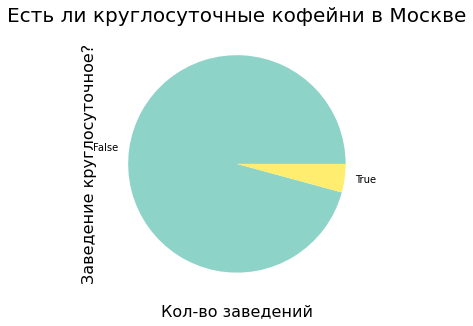

In [57]:
#Build pie plot with coffee houses by working hours
coffeehouses.groupby('is_24/7')['name'].count().plot(kind='pie', figsize=(15,5),colormap='Set3')
plt.title('Есть ли круглосуточные кофейни в Москве', fontdict={'size':20})
plt.ylabel('Заведение круглосуточное?', fontsize=16)
plt.xlabel('Кол-во заведений', fontsize=16)
plt.show()

Круглосуточных кофеен совсем мало, но они есть.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Правильно!
</div>

Теперь посмотрим на рейтинги кофеен в разбивке по районам.

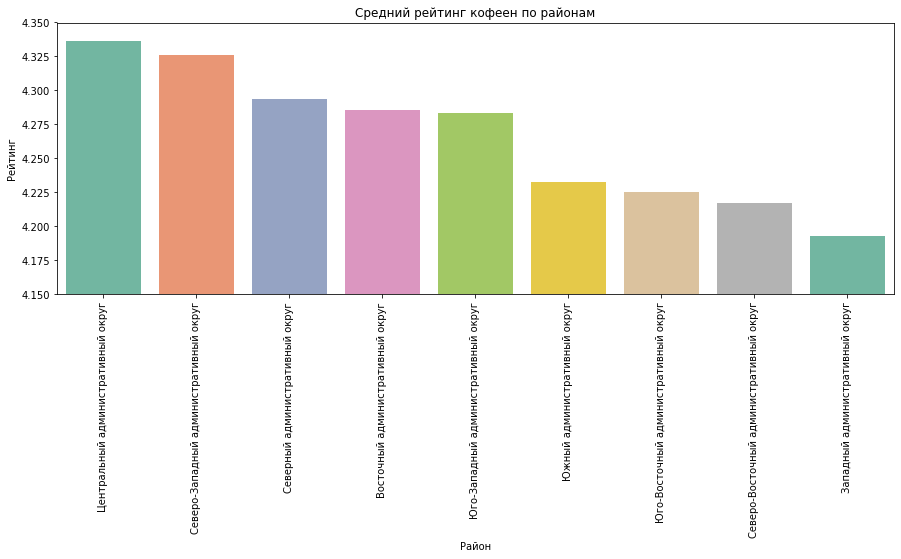

In [58]:
#Show rating of coffee houses by districts
coffee_rating = coffeehouses.groupby('district')['rating'].mean().reset_index().sort_values(by='rating',ascending=False)
plt.figure(figsize=(15,5))
sns.barplot(x='district',y='rating',data=coffee_rating, palette = 'Set2')
plt.title('Средний рейтинг кофеен по районам')
plt.ylabel('Рейтинг')
plt.xlabel('Район')
plt.xticks(rotation=90)
plt.ylim(4.15,4.35)
plt.show()

Рейтинги кофеен варьируют примерно от 4.2 до 4.325, самые высокие - в ЦАО, самые низкие - в ЗАО.

Прикинем среднюю стоимость чашки капучино в кофейнях.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Прекрасно!
</div>

In [59]:
#Exclude rows with no zero as middle coffee cut
coffeehouses_nozero = coffeehouses.query('middle_coffee_cup != 0')

In [60]:
#Show bubble plot with nubmer of seats, rating and capuchino cost 
fig = px.scatter(coffeehouses_nozero, x="seats", y="rating",
          size="seats", color="middle_coffee_cup",
                 hover_name="district", log_x=True, size_max=60)
fig.show()

Итак, как читать информацию в этой диаграмме?
1. в зависимости от количества мест. Если мы хотим большую кофейню - смотрим правее, там самые большие пузырьки. Можно заключить что самые крупные заведения в ЦАО, ЗАО и ЮАО
2. по рейтингу. Хотим приличных соседей - смотрим выше, пятерки есть у ЮВАО, САО, ЦАО, ЮЗАО.
3. по стоимости чашки капучино - это пузырьки максимально желтого цвета (чем выше - тем желтее). 

Так как нам нужно заведение аналогичное Central perk, следует учесть следующие факторы:
- размер заведения: кафе не должно быть большим, это маленькое и уютное место для встречи друзей. Кол-во мест - около 50
- ценник кофейни: "крутое и доступное", так описывают свое представление о новом месте инвесторы. Значит, средний чек и средняя стоимость чашки кофе не должны быть по верхней границе. Но и по нижней оставлять не стоит - мы же не хотим разорить начинающих рестораторов
- расположение: название прототипа указывает на то, что кафе должно быть в центре; также центр удобен тем, что друзьям с разных концов города одинаково удобно добираться. Значит, рассматриваем ЦАО

Итак, посмотрим на кофейни в ЦАО со средним ценником 500-1000 руб (middle average bill в ЦАО составил 1108 руб) и размером заведения 40-60 посетителей. На эти кафе стоит ориентироваться при открытии своего заведения, но конечно новое кафе будет лучше - ведь в нем будет стоять большой уютный диван!

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Интересненько:))
</div>

In [61]:
#Select small average coffee houses in Central region
selected_cafes = coffeehouses.loc[coffeehouses['district'] == "Центральный административный округ"]
selected_cafes = selected_cafes.loc[selected_cafes['middle_avg_bill'] > 500]
selected_cafes = selected_cafes.loc[selected_cafes['middle_avg_bill'] < 1000]
selected_cafes = selected_cafes.loc[selected_cafes['seats'] > 20]
selected_cafes = selected_cafes.loc[selected_cafes['seats'] < 50]

In [62]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=12)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
selected_cafes.apply(create_marker, axis=1)
    
# выводим карту
m

In [63]:
#Let's see common information about selected cafes
selected_cafes.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,6.000000,6.000000,6.000000,6.00000,6.0,6.000000
mean,55.760230,37.607655,4.366667,762.50000,0.0,29.833333
std,0.013406,0.031843,0.175119,99.68701,0.0,5.980524
min,55.743628,37.572702,4.200000,625.00000,0.0,24.000000
25%,55.750157,37.583442,4.300000,700.00000,0.0,25.000000
50%,55.761037,37.604917,4.300000,775.00000,0.0,28.500000
75%,55.767480,37.623295,4.375000,850.00000,0.0,34.250000
max,55.779524,37.657687,4.700000,850.00000,0.0,38.000000


По выбранным для ориентира кофейням можно сделать такие выводы:

1. средний рейтинг 4.37, то есть вполне можно создать на этой территории кафе с более высоким рейтингом и переманить посетителей;
2. средний счет 762.5 руб - вполне в границах наших ожиданий, плюс так как это ЦАО - можно сразу рассчитывать на то что и со средним счетом в 800-900 руб нас примут на ура. Для центра мы все еще будем считаться бюджетным кафе;
3. среднее кол-во посетителей - 30 человек. То, что нужно!

Также судя по локации, наиболее подходящие кофейни сосредоточены в северо-западной части центра Москвы. Можно предположить что идеальное место для новой кофейни - это район Патриарших прудов: между Малой Бронной улицей, Большим Патриаршим, Малым Патриаршим и Ермолаевским переулками.

Но в выбранных кофейнях отсутствует информация о стоимости средней чашки кофе. Рассчитаем ее по ЦАО.

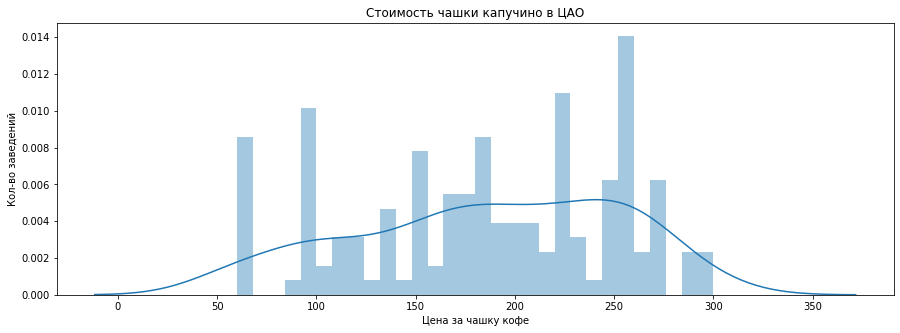

In [64]:
#Calculate middle average coffe cup for Central district
coffe_cup = coffeehouses.loc[coffeehouses['district'] == "Центральный административный округ"]
coffe_cup = coffe_cup.loc[coffe_cup['middle_coffee_cup'] != 0]
plt.figure(figsize=(15,5))
sns.distplot(a=coffe_cup['middle_coffee_cup'], bins=30, kde=True)
plt.title('Стоимость чашки капучино в ЦАО')
plt.xlabel('Цена за чашку кофе')
plt.ylabel('Кол-во заведений')
plt.show()

В большинстве заведений ЦАО цена за чашку капучино около 250 руб.

Но т.к. мы планируем бюджетное заведение, лучше сделать стоимость чашки кофе ниже, идеально - 190 руб. Эта цена не превышает психологически важный рубеж в 200 руб, но при этом очень к нему близка.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Здорово, умничка!
</div>

**Вывод по шагу 4**

- в Москве насчитывается 1395 кофеен, то есть конкуренция приличная
- больше всего кофеен в ЦАО, ЗАО и САО/СВАО, там же где самые высокие рейтинги и средние чеки заведений
- есть круглосуточные кофейни но их очень мало, всего 59
- по кол-ву посетителей: самые крупные кофейни в ЦАО, ЗАО и ЮАО
- по рейтингу: пятерки есть у ЮВАО, САО, ЦАО, ЮЗАО
- по стоимости чашки капучино: самые высокие ценники в ЦАО (около 300 руб), самые низкие - в САО и СВАО

Были выбраны 6 кофеен по основным критериям (размер заведения, средний чек, расположение); по ним рассчитаны средние показатели как ориентир для будущей кофейни:
1. средний рейтинг 4.37, то есть нужно открыть кофейню с рейтингом выше этого;
2. средний счет 762.5 руб - можно ориентироваться на 800-900 руб, т.к. это ЦАО;
3. среднее кол-во посетителей - 30 человек - идеально для маленького уютного кафе.

Стоимость чашки капучино варьирует в ЦАО от 60 до 300 руб, для классного и доступного кафе идеальная стоимость - ***190 руб***, т.к. эта цена не превышает психологически важный рубеж в 200 руб, но при этом очень к нему близка.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Исследование по кофейням выполнено полностью правильно!
</div>

<div style="border:solid blue 3px; padding: 20px">
ОБЩИЙ ВЫВОД
    
Для инвесторов из фонда «Shut Up and Take My Money» мы проанализировали данные о заведениях общественного питания Москвы для целей открытия кофейни типа "Central perk" из сериала Друзья.
    
    1. Идеальное место: Центральный административный округ. Там сосредоточено наибольшее количество успешных заведений, там же больше всего кофеен, но мы его рекомендуем еще и потому что туда будет легко добираться всем друзьям с разных концов большого города; после анализа наиболее похожих по типу кофеен, рекомендуемая локация сузилась до района Патриарших прудов;
    2. Идеальный рейтинг: не ниже 4.37, ведь это средний рейтинг заведений в ЦАО. Следует равняться на заведения с небольшим количеством мест, ведь у них больше высоких оценок (4.9 и 5.0), чем у заведений с кол-вом мест более 150. В целом это нам подходит, т.к. кофейня "Central perk" небольшая и уютная, явно не более 50 мест;
    3. Идеальный средний чек: средний чек по Москве варьирует от 638 до 1108 рублей, но т.к. мы уже определились с локацией (ЦАО) и категорией заведения (кофейня), то смотрим уже точечно на средний чек 762.5 руб. Для новой доступной кофейни с более высоким рейтингом можно ориентироваться на средний чек 800-900 руб;
    4. Идеальная стоимость чашки кофе: 190 руб. Данная цена получено при анализе распределения цен на кофе в ЦАО, а также исходя из запроса (доступное кафе, а не люкс-премиум-класс);
    5. Идеальное вол-во посетителей: 30. Эта цифра рассчитана как среднее по шести самым похожим на наш ориентир кофейням и подходит под запрос.

</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Просто супер класс, молодец!
</div>

Презентация: <https://disk.yandex.ru/i/n1Z3NZnaT2MMpA>

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отличная информативная презентация получилась!
</div>

<div style="border:solid Chocolate 2px; padding: 40px">
Настя, давай подведем итоги. Ты большая молодец, что старалась и проделала такую большую работу. Мне понравилось, что ты наполнила проект развернутыми выводами и наглядно продемонстрировала каждое задание:) Очень хорошая работа получилась!!!
    
    Разберем над чем стоит поработать:

    1. Добавить таблицу с новыми столбцами.

    2. Провести исследование по улицам с одним объектом общепита.

    3. Составляя диаграммы, оценивай как бы они выглядели информативнее.

    
    Пересмотри работу и исправь ошибки. Обязательно пиши, если я могу тебе еще чем-то помочь. Удачи!)
    
![](https://media.giphy.com/media/xUKrrEnN9I5lnrcSMv/giphy-downsized-large.gif)
  

<div class="alert alert-info"> <b>
   Спасибо большое за ревью! Все правки внесла, презу тоже поправила :)
       
</b> </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Настя, молодец! Оперативно откорректировала проект. Благодарю за обратную связь. Работа принята, удачи в обучении:)
</div>